<a href="https://colab.research.google.com/github/jayshah2111/Anime-Face-Generation-DL/blob/main/Anime_Face_Generation_Using_DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

In this project, I will employ DCGAN to generate Anime Faces. DCGAN, or Deep Convolutional GAN, is a generative adversarial network architecture. It uses a couple of guidelines, in particular: Replacing any pooling layers with strided convolutions (discriminator) and fractional-strided convolutions (generator).


The dataset has been taken from Kaggle: https://www.kaggle.com/datasets/soumikrakshit/anime-faces

# Downloading Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install kaggle
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/Colab_Notebooks/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d soumikrakshit/anime-faces

 99% 435M/441M [00:04<00:00, 109MB/s] 
100% 441M/441M [00:04<00:00, 95.3MB/s]


In [ ]:
!unzip /content/anime-faces.zip

Streaming output truncated to the last 5000 lines.
  inflating: data/data/5499.png      
  inflating: data/data/55.png        
  inflating: data/data/550.png       
  inflating: data/data/5500.png      
  inflating: data/data/5501.png      
  inflating: data/data/5502.png      
  inflating: data/data/5503.png      
  inflating: data/data/5504.png      
  inflating: data/data/5505.png      
  inflating: data/data/5506.png      
  inflating: data/data/5507.png      
  inflating: data/data/5508.png      
  inflating: data/data/5509.png      
  inflating: data/data/551.png       
  inflating: data/data/5510.png      
  inflating: data/data/5511.png      
  inflating: data/data/5512.png      
  inflating: data/data/5513.png      
  inflating: data/data/5514.png      
  inflating: data/data/5515.png      
  inflating: data/data/5516.png      
  inflating: data/data/5517.png      
  inflating: data/data/5518.png      
  inflating: data/data/5519.png      
  inflating: data/data/552.png       

#Importing the Necessaries Libraries

In [ ]:
import os
import shutil
import cv2
import tensorflow as tf
import numpy as np
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
from keras import layers, Sequential
from keras.models import Model
from keras.layers import Input, Reshape, Conv2D, Conv2DTranspose, BatchNormalization, ReLU, LeakyReLU, Activation, Flatten
from tqdm.notebook import tqdm
from IPython.display import Image

#Data Loading and Preprocessing

In [ ]:
data_dir = '/content/data'
latent_size = 256
image_size = 64
batch_size = 23

In [ ]:
def load_and_preprocess_data(data_dir, image_size, batch_size):
    data = tf.keras.utils.image_dataset_from_directory(
        data_dir,
        labels='inferred',
        label_mode='int',
        color_mode='rgb',
        image_size=(image_size, image_size),
        batch_size=batch_size,
        shuffle=True,
        seed=42,
    )

    data = data.map(lambda x, y: (x / 255.0, y))
    data = data.map(lambda x, y: (2.0 * x - 1.0, y))

    return data

train_data = load_and_preprocess_data(data_dir, image_size, batch_size)

Found 21551 files belonging to 1 classes.


#Displaying Images

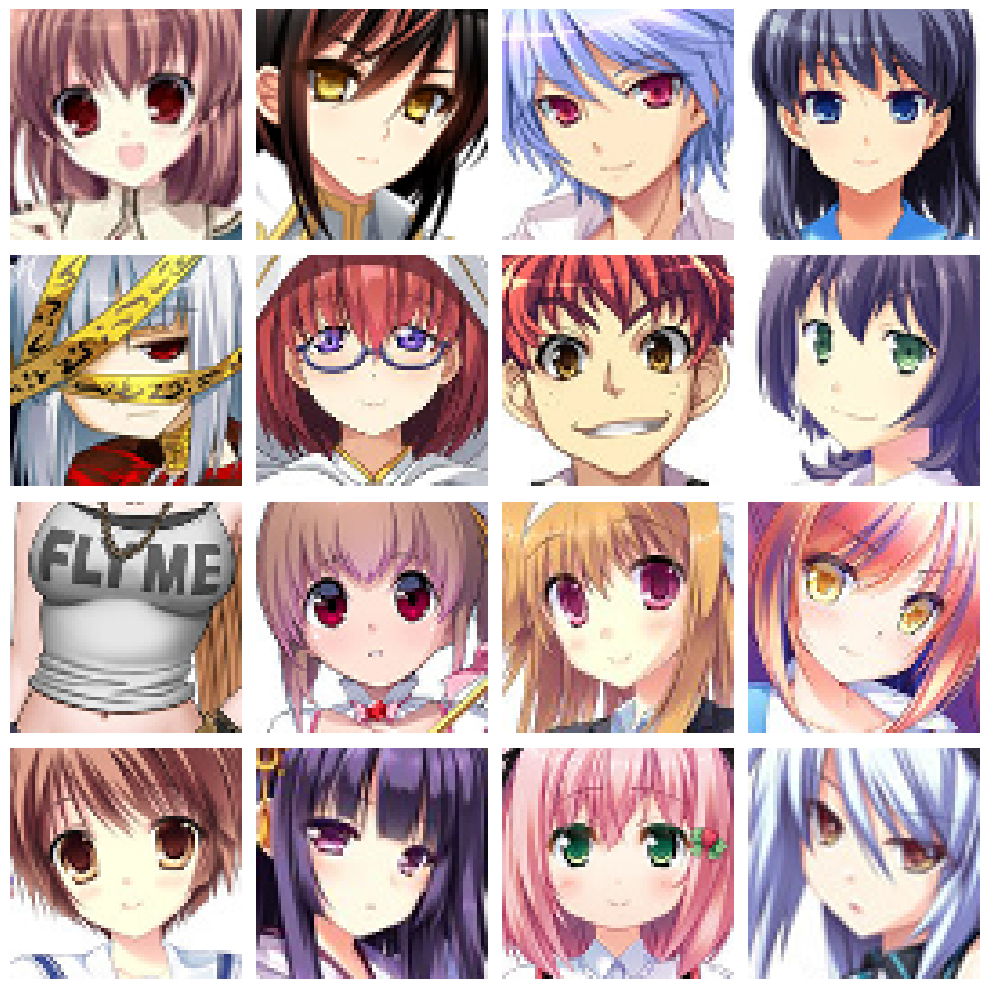

In [ ]:
def display_images(images, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(10, 10))
    for i, ax in enumerate(axes.flat):
        image = (images[i] + 1.0) / 2.0
        ax.imshow(image)
        ax.axis('off')
    plt.tight_layout()
    plt.show()


sample_images, _ = next(iter(train_data))
sample_images = sample_images[:16]

display_images(sample_images, rows=4, cols=4)

#Device Data Loader for GPU/CPU

In [ ]:
class DeviceDataLoader:
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        for batch in self.dl:
            yield self.to_device(batch, self.device)

    def __len__(self):
        return len(self.dl)

    def to_device(self, data, device):
        if isinstance(data, (list, tuple)):
            return [self.to_device(x, device) for x in data]
        return tf.convert_to_tensor(data, dtype=tf.float32)

def get_default_device():
    if tf.test.is_gpu_available():
        return '/GPU:0'
    else:
        return '/CPU:0'

device = get_default_device()

train_dl = DeviceDataLoader(train_data, device)

print(f"Device used: {device}")

Device used: /GPU:0


#Deep Convolutional GAN (DCGAN)

##Generator Architecture

In [ ]:
input_layer = Input(shape=(latent_size,))
reshape_layer = Reshape((1, 1, latent_size))(input_layer)

conv1 = Conv2DTranspose(512, kernel_size=4, strides=2, padding='valid', use_bias=False)(reshape_layer)
bn1 = BatchNormalization()(conv1)
leaky_relu1 = LeakyReLU()(bn1)

conv2 = Conv2DTranspose(256, kernel_size=4, strides=2, padding='same', use_bias=False)(leaky_relu1)
bn2 = BatchNormalization()(conv2)
leaky_relu2 = LeakyReLU()(bn2)

conv3 = Conv2DTranspose(128, kernel_size=4, strides=2, padding='same', use_bias=False)(leaky_relu2)
bn3 = BatchNormalization()(conv3)
leaky_relu3 = LeakyReLU()(bn3)

conv4 = Conv2DTranspose(64, kernel_size=4, strides=2, padding='same', use_bias=False)(leaky_relu3)
bn4 = BatchNormalization()(conv4)
leaky_relu4 = LeakyReLU()(bn4)

conv5 = Conv2DTranspose(3, kernel_size=4, strides=2, padding='same', use_bias=False)(leaky_relu4)
output_layer = Activation('tanh')(conv5)

generator = Model(inputs=input_layer, outputs=output_layer)
generator.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 256)]             0         
                                                                 
 reshape_8 (Reshape)         (None, 1, 1, 256)         0         
                                                                 
 conv2d_transpose_40 (Conv2  (None, 4, 4, 512)         2097152   
 DTranspose)                                                     
                                                                 
 batch_normalization_35 (Ba  (None, 4, 4, 512)         2048      
 tchNormalization)                                               
                                                                 
 leaky_re_lu_35 (LeakyReLU)  (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_41 (Conv2  (None, 8, 8, 256)         2097

##Discriminator Architecture

In [ ]:
input_layer = Input(shape=(64, 64, 3))

conv1 = Conv2D(64, kernel_size=4, strides=2, padding='same', use_bias=False)(input_layer)
bn1 = BatchNormalization()(conv1)
leaky_relu1 = LeakyReLU(0.2)(bn1)

conv2 = Conv2D(128, kernel_size=4, strides=2, padding='same', use_bias=False)(leaky_relu1)
bn2 = BatchNormalization()(conv2)
leaky_relu2 = LeakyReLU(0.2)(bn2)

conv3 = Conv2D(256, kernel_size=4, strides=2, padding='same', use_bias=False)(leaky_relu2)
bn3 = BatchNormalization()(conv3)
leaky_relu3 = LeakyReLU(0.2)(bn3)

conv4 = Conv2D(1, kernel_size=4, strides=1, padding='valid', use_bias=False)(leaky_relu3)

flatten_layer = Flatten()(conv4)
output_layer = Activation('sigmoid')(flatten_layer)

discriminator = Model(inputs=input_layer, outputs=output_layer)

discriminator.summary()

Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 64, 64, 3)]       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 32, 32, 64)        3072      
                                                                 
 batch_normalization_39 (Ba  (None, 32, 32, 64)        256       
 tchNormalization)                                               
                                                                 
 leaky_re_lu_39 (LeakyReLU)  (None, 32, 32, 64)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 16, 16, 128)       131072    
                                                                 
 batch_normalization_40 (Ba  (None, 16, 16, 128)       512       
 tchNormalization)                                        

##Generating Fake Images with the Generator

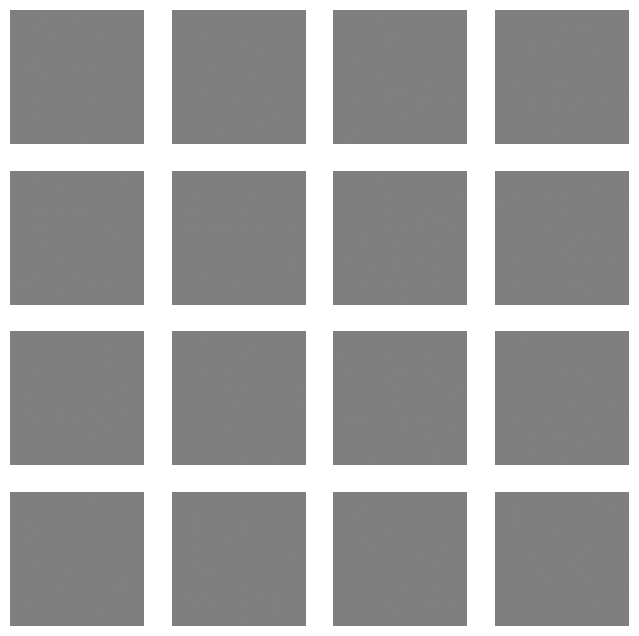

In [ ]:
def to_device(model, device):
    model.build((None, latent_size))
    model.compile()
    return model

device = '/gpu:0'
discriminator = to_device(discriminator, device)
generator = to_device(generator, device)

xb = tf.random.normal(shape=(batch_size, latent_size))
fake_images = generator(xb)

def show_images(images, nmax=16, nrows=4):
    images = (images + 1) / 2.0
    images = np.clip(images, 0, 1)
    ncols = nmax // nrows

    fig, axes = plt.subplots(nrows, ncols, figsize=(8, 8))
    for i in range(nmax):
        ax = axes[i // ncols, i % ncols]
        ax.imshow(images[i])
        ax.axis('off')

    plt.show()


show_images(fake_images.numpy(), nmax=16, nrows=4)

##Training Functions for Generator and Discriminator

In [ ]:
def train_generator(generator, discriminator, opt_g, batch_size, latent_size):
    latent = tf.random.normal((batch_size, latent_size))
    with tf.GradientTape() as tape:
        fake_images = generator(latent, training=True)
        preds = discriminator(fake_images, training=True)
        loss = tf.keras.losses.BinaryCrossentropy()(tf.ones_like(preds), preds)

    gradients = tape.gradient(loss, generator.trainable_variables)
    opt_g.apply_gradients(zip(gradients, generator.trainable_variables))

    return loss

def train_discriminator(generator, discriminator, real_images, opt_d, latent_size):
    with tf.GradientTape() as tape:
        real_preds = discriminator(real_images, training=True)
        fake_latent = tf.random.normal((real_images.shape[0], latent_size))
        fake_images = generator(fake_latent, training=True)
        fake_preds = discriminator(fake_images, training=True)

        real_loss = tf.keras.losses.BinaryCrossentropy()(tf.ones_like(real_preds), real_preds)
        fake_loss = tf.keras.losses.BinaryCrossentropy()(tf.zeros_like(fake_preds), fake_preds)
        loss = real_loss + fake_loss

    gradients = tape.gradient(loss, discriminator.trainable_variables)
    opt_d.apply_gradients(zip(gradients, discriminator.trainable_variables))

    real_score = tf.reduce_mean(real_preds).numpy()
    fake_score = tf.reduce_mean(fake_preds).numpy()

    return loss, real_score, fake_score

##Saving and Displaying Generated Images

In [ ]:
def save_samples(epoch, generator, fixed_latent, show=True, vertical_space=0.2):
    generated_images = generator.predict(fixed_latent)
    num_images = generated_images.shape[0]

    rows = int(np.sqrt(num_images))
    cols = (num_images + rows - 1) // rows

    plt.figure(figsize=(10, 6))
    for i in range(num_images):
        plt.subplot(rows, cols, i + 1)
        img = np.clip(generated_images[i], 0, 1)
        plt.imshow(img)
        plt.axis('off')

    if show:
        plt.savefig('/content/generated_images/image_at_epoch_{:04d}.png'.format(epoch))
        plt.show()
        plt.close()

##Training the DCGAN

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [1/20], loss_g: 2.5023, loss_d: 1.0214, real_score: 0.8236, fake_score: 0.4896
1/1 [==============================] - 0s 228ms/step


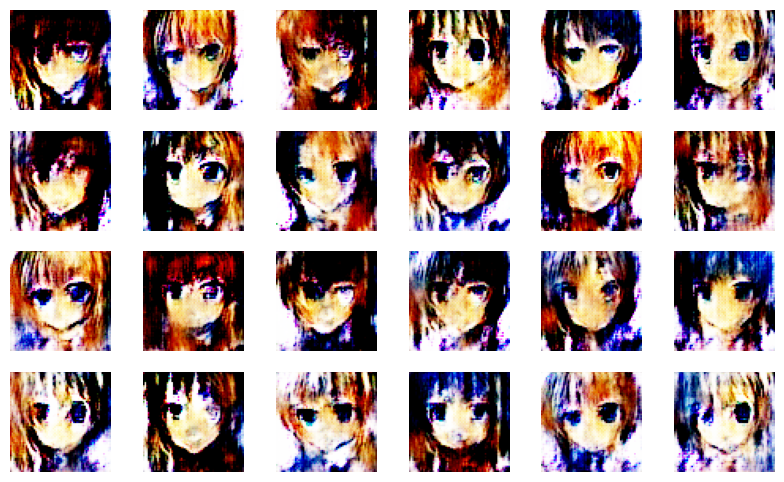

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [2/20], loss_g: 2.9621, loss_d: 0.5472, real_score: 0.7972, fake_score: 0.2218
1/1 [==============================] - 0s 23ms/step


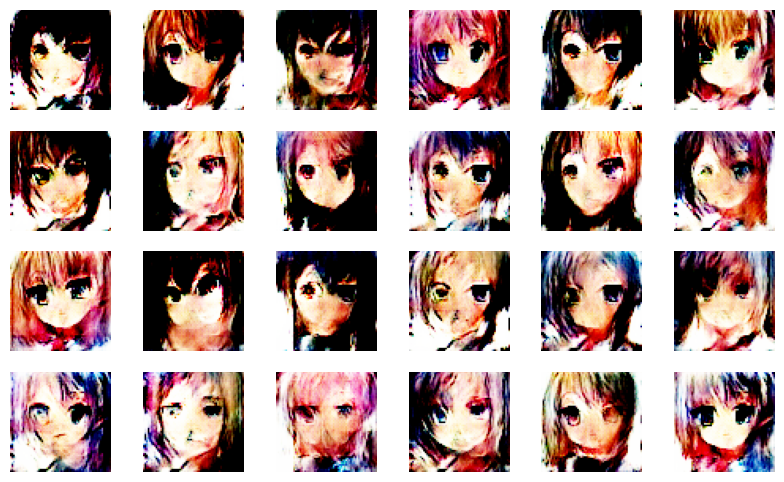

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [3/20], loss_g: 2.5111, loss_d: 0.4608, real_score: 0.8295, fake_score: 0.1943
1/1 [==============================] - 0s 38ms/step


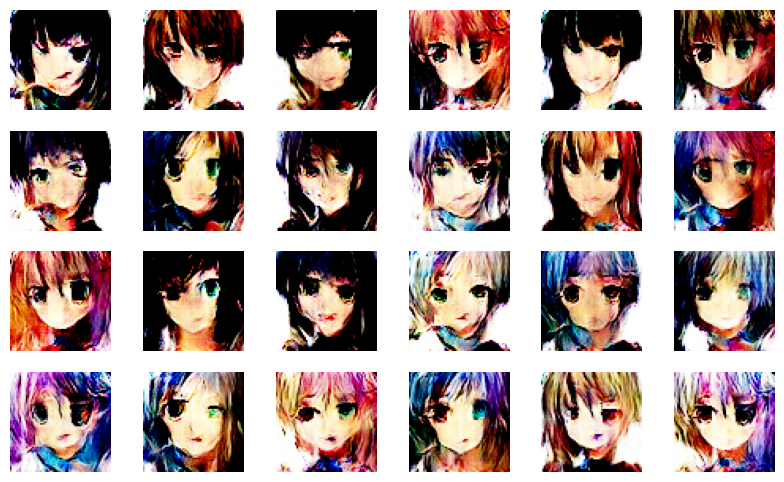

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [4/20], loss_g: 3.8677, loss_d: 0.4832, real_score: 0.9150, fake_score: 0.2571
1/1 [==============================] - 0s 26ms/step


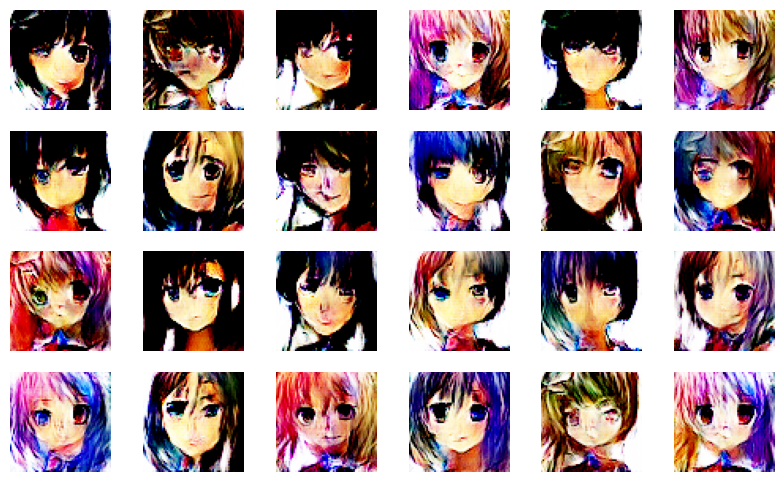

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [5/20], loss_g: 3.3249, loss_d: 0.3989, real_score: 0.7933, fake_score: 0.1006
1/1 [==============================] - 0s 36ms/step


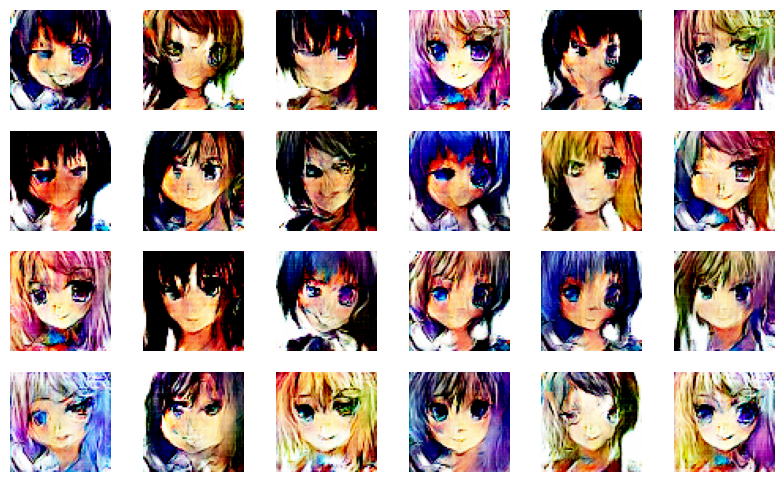

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [6/20], loss_g: 3.2330, loss_d: 0.3496, real_score: 0.8775, fake_score: 0.1341
1/1 [==============================] - 0s 27ms/step


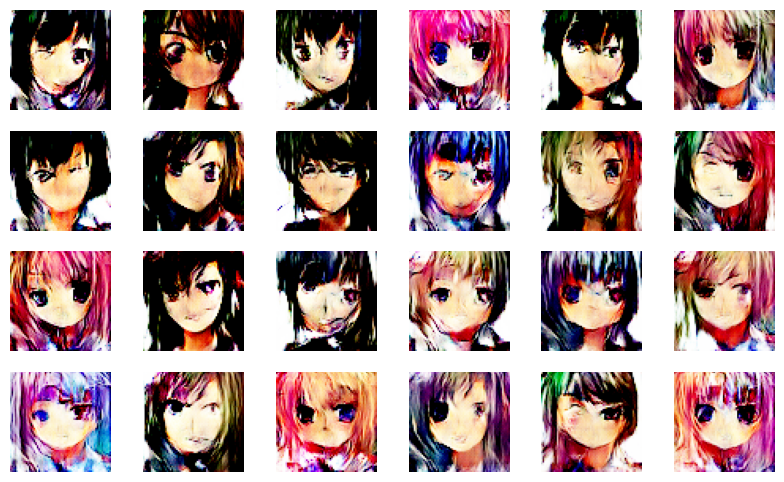

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [7/20], loss_g: 2.0539, loss_d: 0.3270, real_score: 0.8357, fake_score: 0.0817
1/1 [==============================] - 0s 27ms/step


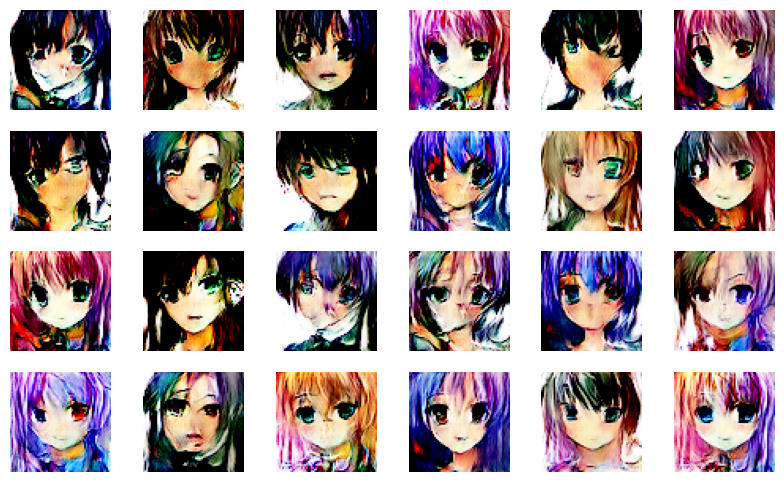

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [8/20], loss_g: 6.0866, loss_d: 1.0227, real_score: 0.9862, fake_score: 0.5207
1/1 [==============================] - 0s 26ms/step


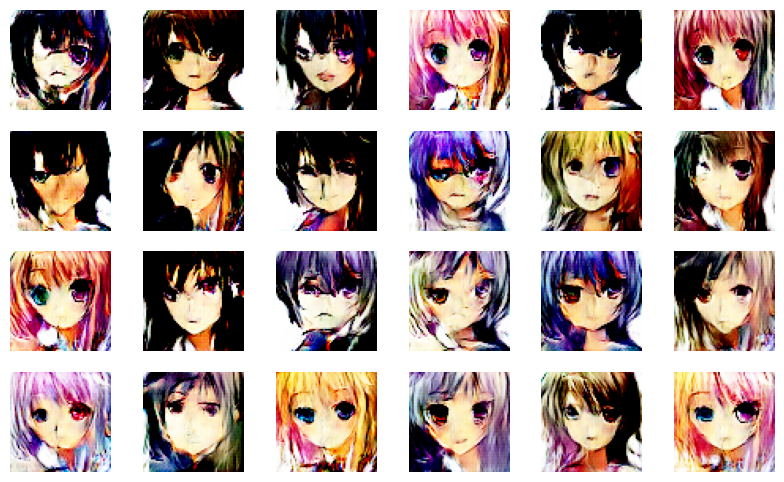

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [9/20], loss_g: 3.5189, loss_d: 0.3300, real_score: 0.8472, fake_score: 0.0844
1/1 [==============================] - 0s 26ms/step


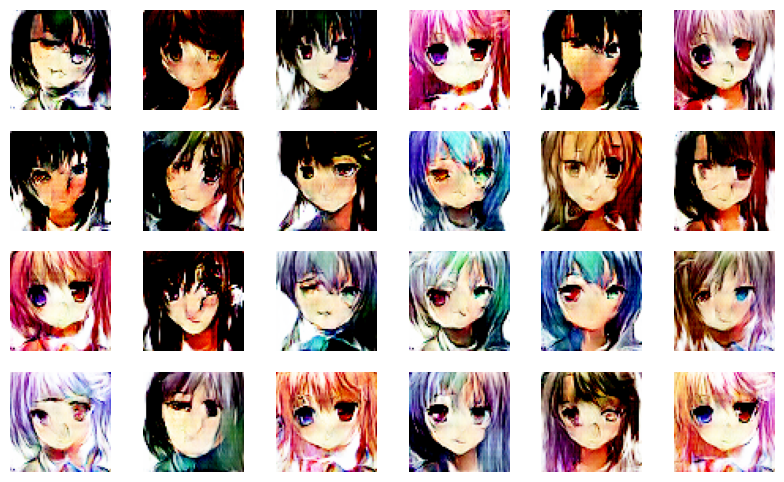

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [10/20], loss_g: 3.6471, loss_d: 0.2311, real_score: 0.9034, fake_score: 0.0870
1/1 [==============================] - 0s 29ms/step


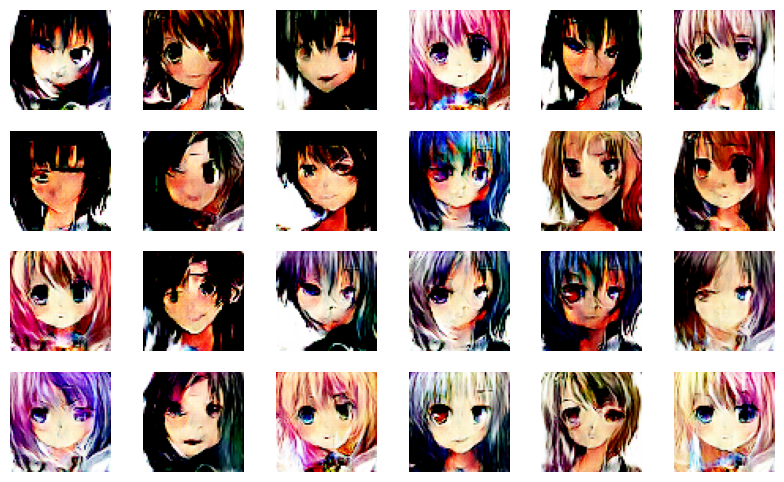

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [11/20], loss_g: 3.5003, loss_d: 0.3435, real_score: 0.8739, fake_score: 0.1317
1/1 [==============================] - 0s 31ms/step


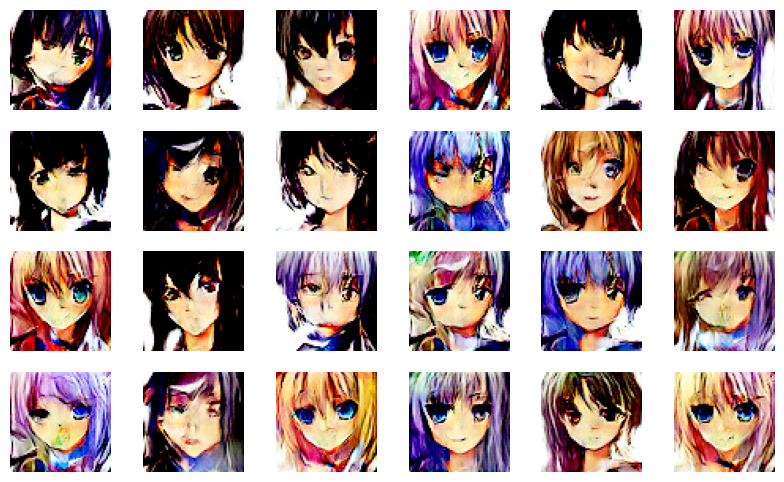

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [12/20], loss_g: 4.2510, loss_d: 0.2437, real_score: 0.9573, fake_score: 0.1342
1/1 [==============================] - 0s 27ms/step


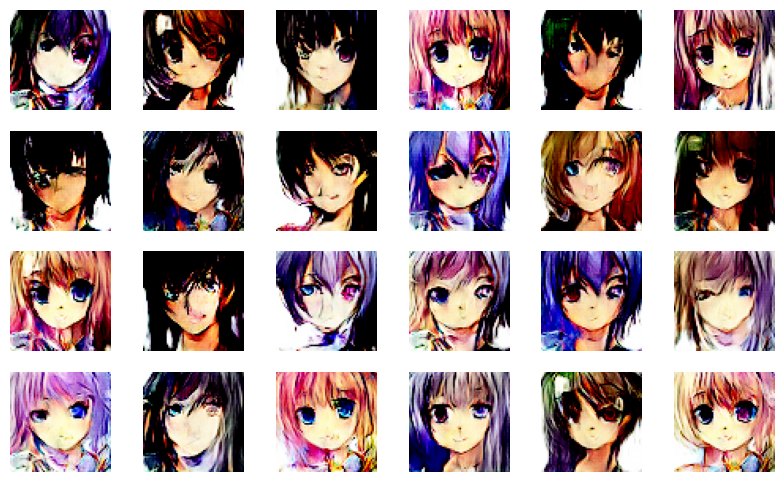

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [13/20], loss_g: 3.7145, loss_d: 0.1858, real_score: 0.9113, fake_score: 0.0603
1/1 [==============================] - 0s 32ms/step


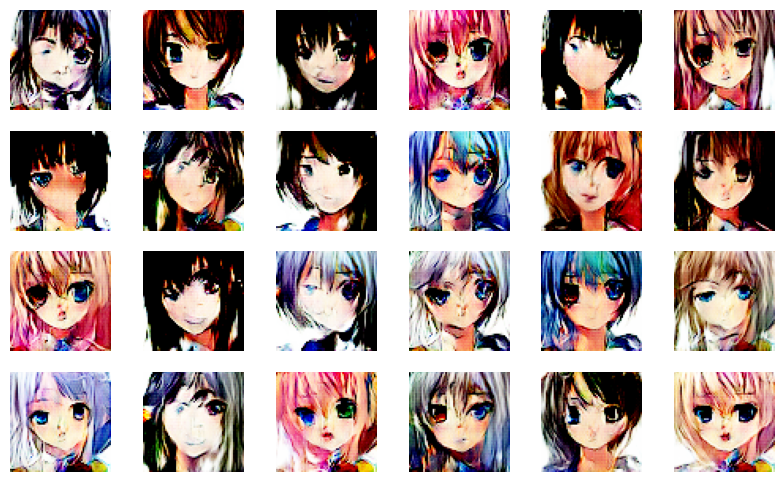

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [14/20], loss_g: 2.9043, loss_d: 0.2404, real_score: 0.8745, fake_score: 0.0523
1/1 [==============================] - 0s 27ms/step


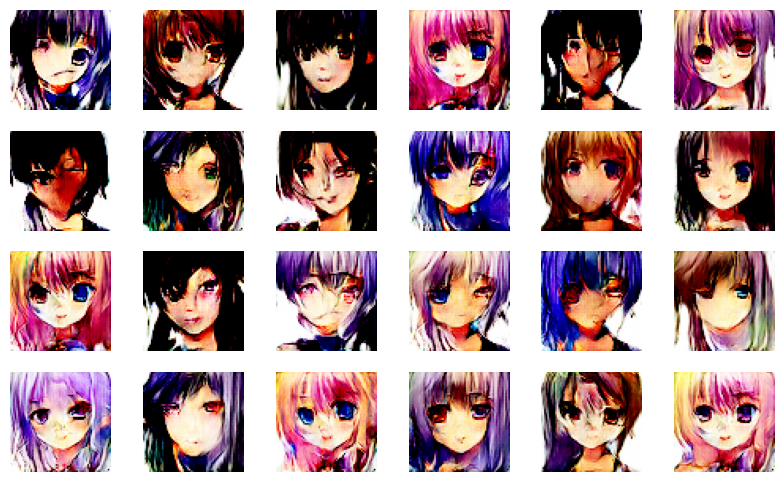

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [15/20], loss_g: 4.6019, loss_d: 0.2396, real_score: 0.9495, fake_score: 0.1387
1/1 [==============================] - 0s 38ms/step


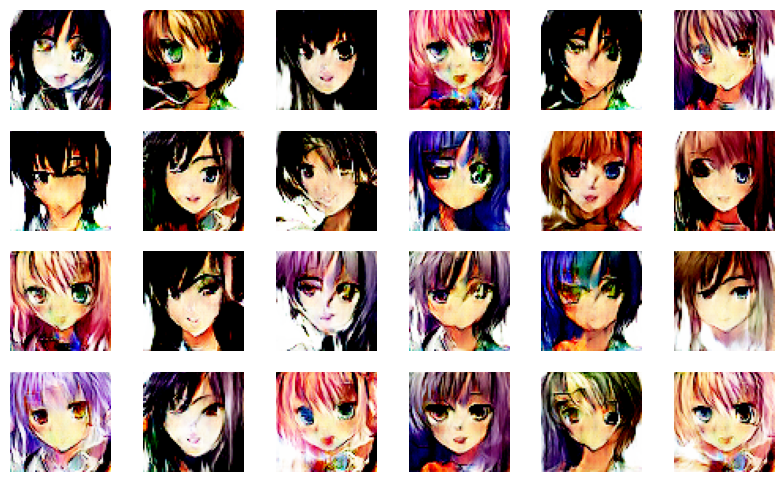

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [16/20], loss_g: 3.3664, loss_d: 0.1867, real_score: 0.9363, fake_score: 0.0836
1/1 [==============================] - 0s 38ms/step


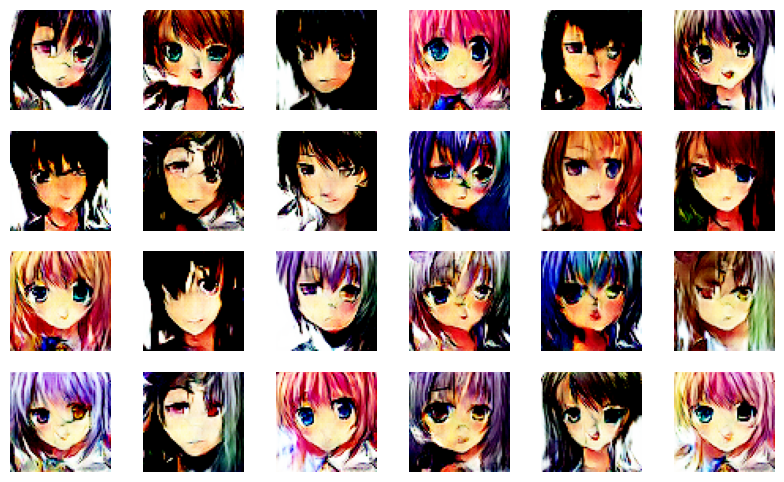

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [17/20], loss_g: 13.4177, loss_d: 2.8972, real_score: 0.9914, fake_score: 0.7796
1/1 [==============================] - 0s 51ms/step


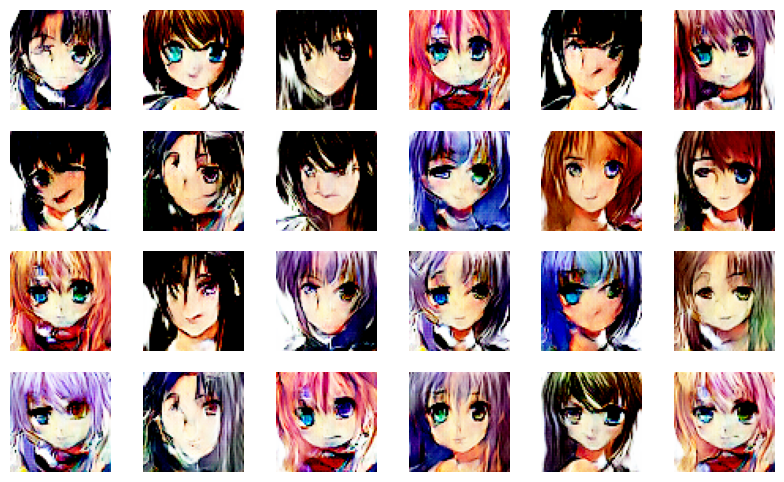

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [18/20], loss_g: 3.6117, loss_d: 0.3725, real_score: 0.7873, fake_score: 0.0109
1/1 [==============================] - 0s 43ms/step


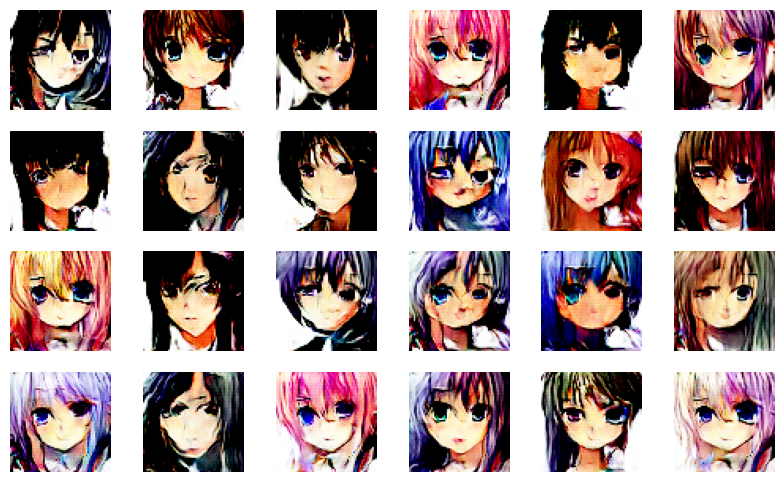

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [19/20], loss_g: 4.6048, loss_d: 0.1210, real_score: 0.9672, fake_score: 0.0628
1/1 [==============================] - 0s 30ms/step


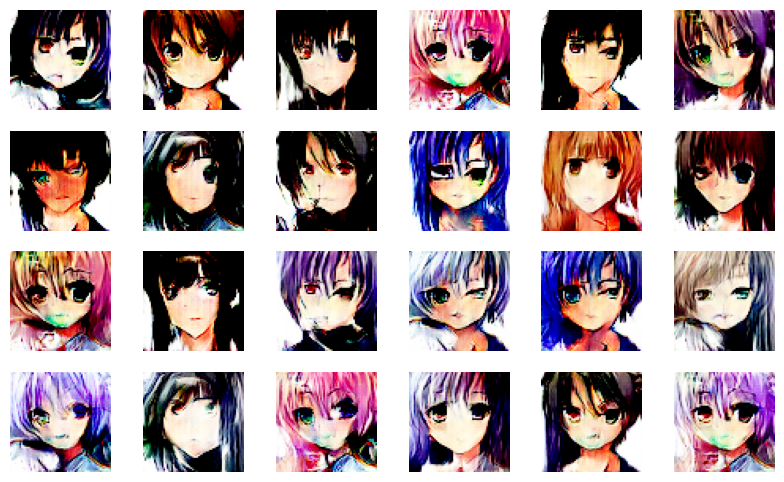

  0%|          | 0/937 [00:00<?, ?it/s]

Epoch [20/20], loss_g: 4.7419, loss_d: 0.1379, real_score: 0.9520, fake_score: 0.0640
1/1 [==============================] - 0s 39ms/step


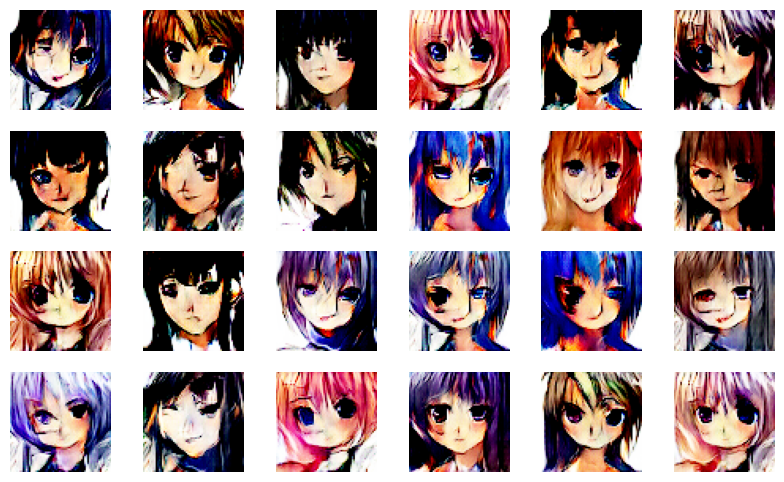

In [ ]:
def generate_fixed_latent(num_samples, latent_size):
    return tf.random.normal((num_samples, latent_size, 1, 1))

fixed_latent = generate_fixed_latent(24, latent_size)

def fit(epochs, start_idx=1):
    losses_g, losses_d = [], []
    real_scores, fake_scores = [], []

    opt_d = tf.keras.optimizers.Adam(0.001, beta_1=0.5, beta_2=0.999)
    opt_g = tf.keras.optimizers.Adam(0.001, beta_1=0.5, beta_2=0.999)

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_data):
            loss_d, real_score, fake_score = train_discriminator(generator, discriminator, real_images, opt_d, latent_size)
            loss_g = train_generator(generator, discriminator, opt_g, batch_size, latent_size)

        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        save_samples(epoch + start_idx, generator, fixed_latent, show=True)

    return losses_g, losses_d, real_scores, fake_scores

epochs = 20

history = fit(epochs)

##Display an Image

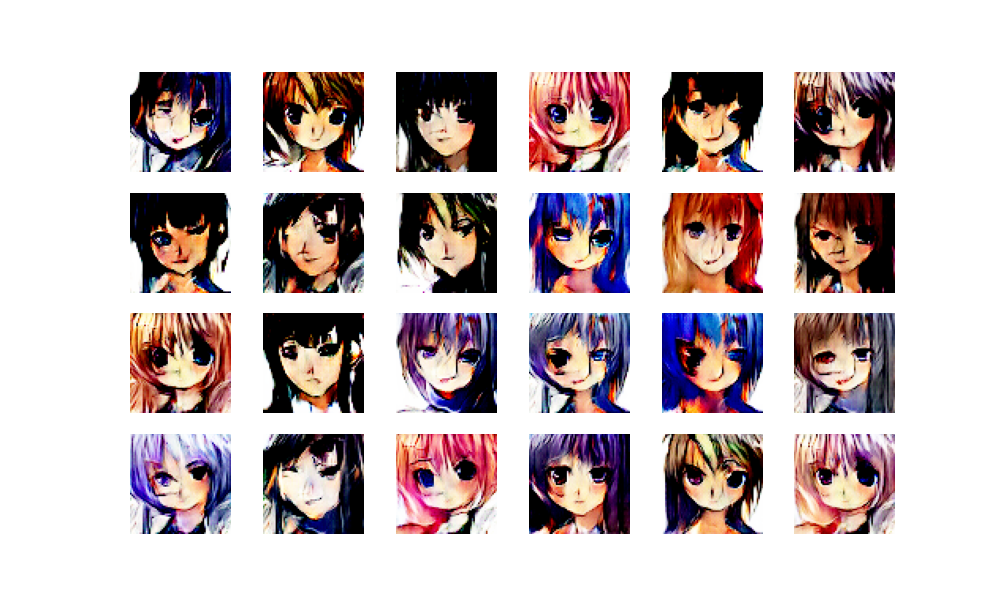

In [ ]:
Image('/content/generated_images/image_at_epoch_0020.png')

##Generating Images with the Trained Generator

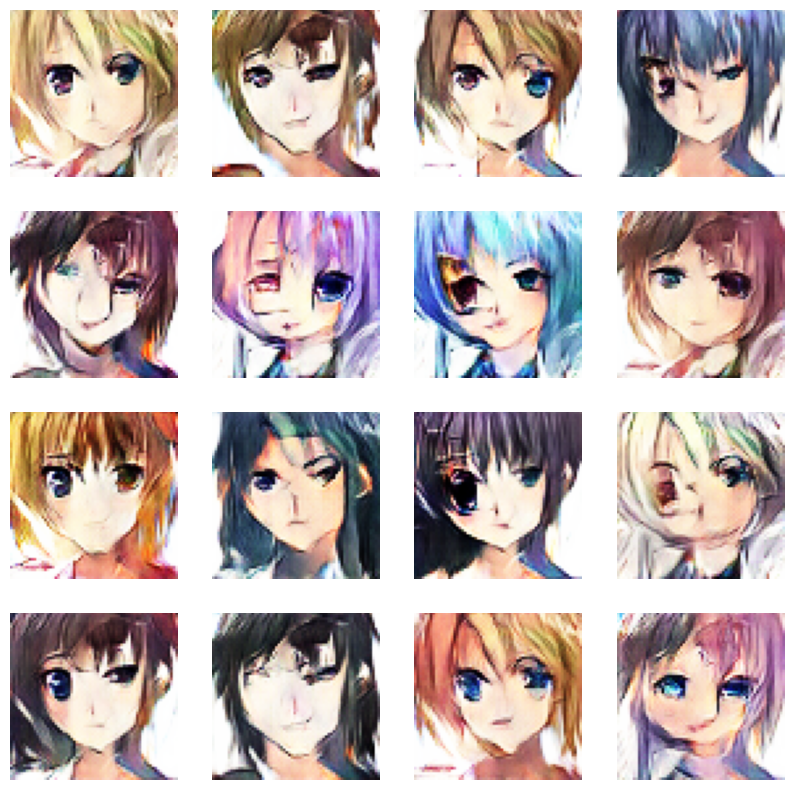

In [ ]:
num_generated_images = 16
random_latent_vectors = generate_fixed_latent(num_generated_images, latent_size)

generated_images = generator(random_latent_vectors, training=False)
generated_images = 0.5 * generated_images + 0.5

plt.figure(figsize=(10, 10))
for i in range(num_generated_images):
    plt.subplot(4, 4, i + 1)
    plt.imshow(generated_images[i])
    plt.axis('off')
plt.show()

##Generating Video from Generated Images

In [ ]:
sample_dir= '/content/generated_images'

def save_frames_as_video(filename, images_path):
  vid_fname = filename

  files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if images_path in f]
  files.sort()

  out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (1080,720))
  [out.write(cv2.imread(fname)) for fname in files]

  out.release()

save_frames_as_video("anime_face_dcgan.mp4", "generated")